# Import Libraries

In [1]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from swarmintelligence import Utilization
from scipy.stats import wilcoxon
import cv2
from sewar.full_ref import *

# Load Experiments Results

In [2]:
# key inner join later
on=['image_name', 'thresholds']

## Single Method

In [3]:
# group each results by SI Methods
pso_masi_results = pickle.load(open('results/evaluation/PSO/PSO_masi_RGB_df.pkl', 'rb'))
ga_masi_results = pickle.load(open('results/evaluation/GA/GA_masi_RGB_df.pkl', 'rb'))
woa_masi_results = pickle.load(open('results/evaluation/WOA/WOA_masi_RGB_df.pkl', 'rb'))
gwo_masi_results = pickle.load(open('results/evaluation/GWO/GWO_masi_RGB_df.pkl', 'rb'))
sma_masi_results = pickle.load(open('results/evaluation/SMA/SMA_masi_RGB_df.pkl', 'rb'))
mem_gwo_masi_results = pickle.load(open('results/evaluation/memGWO/memGWO_masi_RGB_df.pkl', 'rb'))

In [4]:
mem_gwo_masi_results.head()

,image_name,thresholds,fitness_function,obj,Mean best_thresholds R,Mean best_thresholds G,Mean best_thresholds B,Mean Fitness R,Mean Fitness G,Mean Fitness B,...,Regions B,Fitness R,Fitness G,Fitness B,CPU_time (seconds),MSE,RMSE,PSNR,SSIM,UQI
0,AirplaneF16.tiff,2,mMasi_entropy,max,"[121, 178]","[94, 166]","[125, 182]",930.781148,2436.358480,1787.919850,...,"[[125, 255, 255, 255, 255, 255, 255, 255, 255,...","[930.7811479817464, 930.7811479817464, 930.781...","[2436.3584799702053, 2436.3584799702053, 2436....","[1787.9236630530743, 1787.8950628016757, 1787....","[3.311678409576416, 3.2134530544281006, 3.9564...","[2293.7582194010415, 2294.8509559631348, 2293....","[47.893195961441556, 47.90460265948497, 47.893...","[14.525327230279872, 14.523258762690128, 14.52...","[0.7809698970724323, 0.7808925042383067, 0.780...","[0.941043257168062, 0.9409655254747173, 0.9410..."
1,AirplaneF16.tiff,3,mMasi_entropy,max,"[107, 158, 196]","[78, 138, 189]","[122, 173, 201]",971.128039,2534.072884,1856.433312,...,"[[122, 255, 201, 255, 255, 201, 201, 201, 201,...","[971.1290558159712, 971.1290558159712, 971.129...","[2534.075361427361, 2534.075361427361, 2534.07...","[1856.4464905049515, 1856.4464905049515, 1856....","[3.219210386276245, 5.392597436904907, 4.39150...","[1572.9299570719402, 1572.9299570719402, 1590....","[39.6601810015025, 39.6601810015025, 39.886905...","[16.163709770459146, 16.163709770459146, 16.11...","[0.7344375813345811, 0.7344375813345811, 0.736...","[0.9584716610352234, 0.9584716610352234, 0.958..."
2,AirplaneF16.tiff,4,mMasi_entropy,max,"[84, 127, 170, 200]","[67, 117, 165, 202]","[112, 151, 181, 204]",994.879624,2587.598116,1901.900339,...,"[[112, 204, 204, 255, 204, 204, 204, 204, 204,...","[994.9173824090514, 994.9164234651097, 994.871...","[2586.984140373768, 2587.651267179317, 2587.63...","[1901.942457673443, 1901.9224042645144, 1901.9...","[3.2313883304595947, 2.666203737258911, 3.0300...","[1176.7511494954426, 1159.3238054911296, 1158....","[34.3038066327258, 34.04884440757321, 34.04018...","[17.423957296536383, 17.48875607132751, 17.490...","[0.7187304621132752, 0.717710036653104, 0.7178...","[0.9693482472227504, 0.9695053586412085, 0.969..."
3,AirplaneF16.tiff,5,mMasi_entropy,max,"[76, 113, 149, 181, 203]","[60, 103, 142, 181, 206]","[109, 145, 172, 193, 208]",1006.576502,2618.874104,1923.379857,...,"[[109, 208, 208, 208, 208, 208, 208, 208, 208,...","[1006.6764153160965, 1006.9101171808625, 1006....","[2619.0155014560924, 2618.409983426493, 2618.9...","[1923.5483785058364, 1923.5303845650399, 1923....","[4.969174385070801, 4.890013217926025, 4.01218...","[865.5765215555826, 854.21550877889, 838.73560...","[29.420681867617933, 29.22696543910931, 28.960...","[18.757748930235557, 18.815129088368682, 18.89...","[0.7262745845807789, 0.7274287062725207, 0.728...","[0.9769369445147399, 0.9773351472884396, 0.977..."
4,Lena.png,2,mMasi_entropy,max,"[137, 196]","[78, 146]","[96, 141]",1004.913932,2393.647254,2181.867082,...,"[[141, 141, 141, 141, 141, 141, 141, 141, 141,...","[1004.9139322682681, 1004.9139322682681, 1004....","[2393.647254097627, 2393.647254097627, 2393.64...","[2181.8670821363294, 2181.8670821363294, 2181....","[4.7781641483306885, 4.762095928192139, 4.6736...","[1858.9784520467122, 1858.9784520467122, 1858....","[43.115872391112674, 43.115872391112674, 43.11...","[15.43806005098941, 15.43806005098941, 15.4380...","[0.6394589731037388, 0.6394589731037388, 0.639...","[0.8954769944582632, 0.8954769944582632, 0.895..."


### Grouping by Metrics Evaluation

In [5]:
### ========== PSNR
ga_psnr = ga_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
pso_psnr = pso_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
woa_psnr = woa_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
gwo_psnr = gwo_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
sma_psnr = sma_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
mem_gwo_psnr = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()


ga_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GA', 'PSNR': 'PSNR GA'}, inplace=True)
pso_psnr.rename(columns={'Mean PSNR': 'Mean PSNR PSO','PSNR': 'PSNR PSO'}, inplace=True)
woa_psnr.rename(columns={'Mean PSNR': 'Mean PSNR WOA','PSNR': 'PSNR WOA'}, inplace=True)
gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GWO','PSNR': 'PSNR GWO'}, inplace=True)
sma_psnr.rename(columns={'Mean PSNR': 'Mean PSNR SMA', 'PSNR': 'PSNR SMA'}, inplace=True)
mem_gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR MemoryGWO','PSNR': 'PSNR MemoryGWO'}, inplace=True)


### ======== RMSE
ga_rmse = ga_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
pso_rmse = pso_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
woa_rmse = woa_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
gwo_rmse = gwo_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
sma_rmse = sma_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
mem_gwo_rmse = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()


ga_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GA', 'RMSE': 'RMSE GA'}, inplace=True)
pso_rmse.rename(columns={'Mean RMSE': 'Mean RMSE PSO','RMSE': 'RMSE PSO'}, inplace=True)
woa_rmse.rename(columns={'Mean RMSE': 'Mean RMSE WOA','RMSE': 'RMSE WOA'}, inplace=True)
gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GWO','RMSE': 'RMSE GWO'}, inplace=True)
sma_rmse.rename(columns={'Mean RMSE': 'Mean RMSE SMA', 'RMSE': 'RMSE SMA'}, inplace=True)
mem_gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE MemoryGWO','RMSE': 'RMSE MemoryGWO'}, inplace=True)


### ======== SSIM
ga_ssim = ga_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
pso_ssim = pso_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
woa_ssim = woa_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
gwo_ssim = gwo_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
sma_ssim = sma_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
mem_gwo_ssim = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()


ga_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GA', 'SSIM': 'SSIM GA'}, inplace=True)
pso_ssim.rename(columns={'Mean SSIM': 'Mean SSIM PSO','SSIM': 'SSIM PSO'}, inplace=True)
woa_ssim.rename(columns={'Mean SSIM': 'Mean SSIM WOA','SSIM': 'SSIM WOA'}, inplace=True)
gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GWO','SSIM': 'SSIM GWO'}, inplace=True)
sma_ssim.rename(columns={'Mean SSIM': 'Mean SSIM SMA', 'SSIM': 'SSIM SMA'}, inplace=True)
mem_gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM MemoryGWO','SSIM': 'SSIM MemoryGWO'}, inplace=True)


### ======== UQI
ga_uqi = ga_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
pso_uqi = pso_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
woa_uqi = woa_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
gwo_uqi = gwo_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
sma_uqi = sma_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
mem_gwo_uqi = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()


ga_uqi.rename(columns={'Mean UQI': 'Mean UQI GA', 'UQI': 'UQI GA'}, inplace=True)
pso_uqi.rename(columns={'Mean UQI': 'Mean UQI PSO','UQI': 'UQI PSO'}, inplace=True)
woa_uqi.rename(columns={'Mean UQI': 'Mean UQI WOA','UQI': 'UQI WOA'}, inplace=True)
gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI GWO','UQI': 'UQI GWO'}, inplace=True)
sma_uqi.rename(columns={'Mean UQI': 'Mean UQI SMA', 'UQI': 'UQI SMA'}, inplace=True)
mem_gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI MemoryGWO','UQI': 'UQI MemoryGWO'}, inplace=True)



### ======== Fitness Value R
pso_fitness_r = pso_masi_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
gwo_fitness_r = gwo_masi_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
mem_gwo_fitness_r= mem_gwo_masi_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
ga_fitness_r = ga_masi_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
woa_fitness_r = woa_masi_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
sma_fitness_r = sma_masi_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()

pso_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R PSO','Fitness R': 'Fitness R PSO'}, inplace=True)
gwo_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R GWO','Fitness R': 'Fitness R GWO'}, inplace=True)
mem_gwo_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R MemoryGWO','Fitness R': 'Fitness R MemoryGWO'}, inplace=True)
ga_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R GA', 'Fitness R': 'Fitness R GA'}, inplace=True)
woa_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R WOA','Fitness R': 'Fitness R WOA'}, inplace=True)
sma_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R SMA', 'Fitness R': 'Fitness R SMA'}, inplace=True)

### ======== Fitness Value G
pso_fitness_g = pso_masi_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
gwo_fitness_g = gwo_masi_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
mem_gwo_fitness_g= mem_gwo_masi_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
ga_fitness_g = ga_masi_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
woa_fitness_g = woa_masi_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
sma_fitness_g = sma_masi_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()

pso_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G PSO','Fitness G': 'Fitness G PSO'}, inplace=True)
gwo_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G GWO','Fitness G': 'Fitness G GWO'}, inplace=True)
mem_gwo_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G MemoryGWO','Fitness G': 'Fitness G MemoryGWO'}, inplace=True)
ga_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G GA', 'Fitness G': 'Fitness G GA'}, inplace=True)
woa_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G WOA','Fitness G': 'Fitness G WOA'}, inplace=True)
sma_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G SMA', 'Fitness G': 'Fitness G SMA'}, inplace=True)

### ======== Fitness Value B
pso_fitness_b = pso_masi_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
gwo_fitness_b = gwo_masi_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
mem_gwo_fitness_b= mem_gwo_masi_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
ga_fitness_b = ga_masi_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
woa_fitness_b = woa_masi_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
sma_fitness_b = sma_masi_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()

pso_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B PSO','Fitness B': 'Fitness B PSO'}, inplace=True)
gwo_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B GWO','Fitness B': 'Fitness B GWO'}, inplace=True)
mem_gwo_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B MemoryGWO','Fitness B': 'Fitness B MemoryGWO'}, inplace=True)
ga_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B GA', 'Fitness B': 'Fitness B GA'}, inplace=True)
woa_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B WOA','Fitness B': 'Fitness B WOA'}, inplace=True)
sma_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B SMA', 'Fitness B': 'Fitness B SMA'}, inplace=True)


### ======== CPU Time
ga_cpu_time = ga_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
pso_cpu_time = pso_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
woa_cpu_time = woa_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
gwo_cpu_time = gwo_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
sma_cpu_time = sma_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
mem_gwo_cpu_time = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()


ga_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GA', 'CPU_time (seconds)': 'CPU_time (seconds) GA'}, inplace=True)
pso_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) PSO','CPU_time (seconds)': 'CPU_time (seconds) PSO'}, inplace=True)
woa_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) WOA','CPU_time (seconds)': 'CPU_time (seconds) WOA'}, inplace=True)
gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GWO','CPU_time (seconds)': 'CPU_time (seconds) GWO'}, inplace=True)
sma_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) SMA', 'CPU_time (seconds)': 'CPU_time (seconds) SMA'}, inplace=True)
mem_gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) MemoryGWO','CPU_time (seconds)': 'CPU_time (seconds) MemoryGWO'}, inplace=True)


### ========== Threshold R
pso_threshold_r = pso_masi_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
gwo_threshold_r = gwo_masi_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
mem_gwo_threshold_r = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
ga_threshold_r = ga_masi_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
woa_threshold_r = woa_masi_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
sma_threshold_r = sma_masi_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()

pso_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R PSO'}, inplace=True)
gwo_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R GWO'}, inplace=True)
mem_gwo_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R MemoryGWO'}, inplace=True)
ga_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R GA'}, inplace=True)
woa_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R WOA'}, inplace=True)
sma_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R SMA'}, inplace=True)

### ========== Threshold G
pso_threshold_g = pso_masi_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
gwo_threshold_g = gwo_masi_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
mem_gwo_threshold_g = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
ga_threshold_g = ga_masi_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
woa_threshold_g = woa_masi_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
sma_threshold_g = sma_masi_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()

pso_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G PSO'}, inplace=True)
gwo_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G GWO'}, inplace=True)
mem_gwo_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G MemoryGWO'}, inplace=True)
ga_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G GA'}, inplace=True)
woa_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G WOA'}, inplace=True)
sma_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G SMA'}, inplace=True)

### ========== Threshold B
pso_threshold_b = pso_masi_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
gwo_threshold_b = gwo_masi_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
mem_gwo_threshold_b = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
ga_threshold_b = ga_masi_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
woa_threshold_b = woa_masi_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
sma_threshold_b = sma_masi_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()

pso_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B PSO'}, inplace=True)
gwo_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B GWO'}, inplace=True)
mem_gwo_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B MemoryGWO'}, inplace=True)
ga_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B GA'}, inplace=True)
woa_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B WOA'}, inplace=True)
sma_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B SMA'}, inplace=True)

### Merge Results

In [6]:
### ======== PSNR
psnr_merge = pso_psnr.merge(gwo_psnr, on=on).merge(mem_gwo_psnr, on=on).merge(ga_psnr, on=on).merge(sma_psnr, on=on).merge(woa_psnr, on=on)
psnr_merge = psnr_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== RMSE
rmse_merge = pso_rmse.merge(gwo_rmse, on=on).merge(mem_gwo_rmse, on=on).merge(ga_rmse, on=on).merge(sma_rmse, on=on).merge(woa_rmse, on=on)
rmse_merge = rmse_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== SSIM
ssim_merge = pso_ssim.merge(gwo_ssim, on=on).merge(mem_gwo_ssim, on=on).merge(ga_ssim, on=on).merge(sma_ssim, on=on).merge(woa_ssim, on=on)
ssim_merge = ssim_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== UQI
uqi_merge = pso_uqi.merge(gwo_uqi, on=on).merge(mem_gwo_uqi, on=on).merge(ga_uqi, on=on).merge(sma_uqi, on=on).merge(woa_uqi, on=on)
uqi_merge = uqi_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== CPU Time
cpu_time_merge = pso_cpu_time.merge(gwo_cpu_time, on=on).merge(mem_gwo_cpu_time, on=on).merge(ga_cpu_time, on=on).merge(sma_cpu_time, on=on).merge(woa_cpu_time, on=on)
cpu_time_merge = cpu_time_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])


### ======== Fitness Value R
fitness_r_merge = pso_fitness_r.merge(gwo_fitness_r, on=on).merge(mem_gwo_fitness_r, on=on).merge(ga_fitness_r, on=on).merge(sma_fitness_r, on=on).merge(woa_fitness_r, on=on)
fitness_r_merge = fitness_r_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Fitness Value G
fitness_g_merge = pso_fitness_g.merge(gwo_fitness_g, on=on).merge(mem_gwo_fitness_g, on=on).merge(ga_fitness_g, on=on).merge(sma_fitness_g, on=on).merge(woa_fitness_g, on=on)
fitness_g_merge = fitness_g_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Fitness Value B
fitness_b_merge = pso_fitness_b.merge(gwo_fitness_b, on=on).merge(mem_gwo_fitness_b, on=on).merge(ga_fitness_b, on=on).merge(sma_fitness_b, on=on).merge(woa_fitness_b, on=on)
fitness_b_merge = fitness_b_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])


### ======== Threshold R
threshold_r_merge = pso_threshold_r.merge(gwo_threshold_r, on=on).merge(mem_gwo_threshold_r, on=on).merge(ga_threshold_r, on=on).merge(sma_threshold_r, on=on).merge(woa_threshold_r, on=on)
threshold_r_merge = threshold_r_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Threshold G
threshold_g_merge = pso_threshold_g.merge(gwo_threshold_g, on=on).merge(mem_gwo_threshold_g, on=on).merge(ga_threshold_g, on=on).merge(sma_threshold_g, on=on).merge(woa_threshold_g, on=on)
threshold_g_merge = threshold_g_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Threshold B
threshold_b_merge = pso_threshold_b.merge(gwo_threshold_b, on=on).merge(mem_gwo_threshold_b, on=on).merge(ga_threshold_b, on=on).merge(sma_threshold_b, on=on).merge(woa_threshold_b, on=on)
threshold_b_merge = threshold_b_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### Find Best value in each metrics

In [7]:
algorithms = ['PSO', 'GA', 'WOA', 'GWO', 'SMA', 'MemoryGWO']

def findMaximumMetrics(list_of_values):
    return max(list_of_values)

def findMinimumMetrics(list_of_values):
    return min(list_of_values)

def calculateStandardDeviation(list_of_values):
    return np.std(list_of_values)

In [8]:
for idx_algo, algo in enumerate(algorithms):
    # find the best value from 30 running each methods
    psnr_merge[f'Best PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(findMaximumMetrics)     
    rmse_merge[f'Best RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(findMaximumMetrics)     
    ssim_merge[f'Best SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(findMaximumMetrics)     
    uqi_merge[f'Best UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(findMaximumMetrics)     
    cpu_time_merge[f'Best CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(findMinimumMetrics)
    fitness_r_merge[f'Best Fitness R {algo}'] = fitness_r_merge[f'Fitness R {algo}'].apply(findMaximumMetrics)
    fitness_g_merge[f'Best Fitness G {algo}'] = fitness_g_merge[f'Fitness G {algo}'].apply(findMaximumMetrics)    
    fitness_b_merge[f'Best Fitness B {algo}'] = fitness_b_merge[f'Fitness B {algo}'].apply(findMaximumMetrics)
    
    # calculate standard deviation
    psnr_merge[f'Std PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(calculateStandardDeviation)     
    rmse_merge[f'Std RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(calculateStandardDeviation)     
    ssim_merge[f'Std SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(calculateStandardDeviation)     
    uqi_merge[f'Std UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(calculateStandardDeviation)     
    cpu_time_merge[f'Std CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(calculateStandardDeviation)
    fitness_r_merge[f'Std Fitness R {algo}'] = fitness_r_merge[f'Fitness R {algo}'].apply(calculateStandardDeviation)
    fitness_g_merge[f'Std Fitness G {algo}'] = fitness_g_merge[f'Fitness G {algo}'].apply(calculateStandardDeviation)    
    fitness_b_merge[f'Std Fitness B {algo}'] = fitness_b_merge[f'Fitness B {algo}'].apply(calculateStandardDeviation)    

# Quantitative Image Analysis

## Mean PSNR

In [9]:
psnr_merge

thresholds  Mean PSNR PSO   
image_name                                            
AirplaneF16.tiff      0            2      14.523935  \
                      1            3      16.195860   
                      2            4      17.345886   
                      3            5      18.783507   
Lena.png              4            2      15.435569   
                      5            3      17.441222   
                      6            4      19.447923   
                      7            5      20.860035   
Male.tiff             8            2      11.558751   
                      9            3      14.211726   
                      10           4      17.645589   
                      11           5      19.341099   
Mandrill.tiff         12           2      14.801786   
                      13           3      16.907277   
                      14           4      18.342704   
                      15           5      19.176159   
Peppers.tiff          16           2      13.856600   
                      17           3      15.198166   
                      18           4      17.292825   
                      19           5      18.437573   
Sailboat on lake.tiff 20           2      14.855689   
                      21           3      16.526814   
                      22           4      18.757278   
                      23           5      19.783885   

                                                                   PSNR PSO   
image_name                                                                    
AirplaneF16.tiff      0   [14.525040659308385, 14.525327230279872, 14.52...  \
                      1   [16.220488352545686, 16.32235397540476, 16.315...   
                      2   [17.65167608403719, 17.779411954564022, 17.732...   
                      3   [18.77567016027345, 18.956000271039372, 18.631...   
Lena.png              4   [15.43806005098941, 15.425874947610865, 15.433...   
                      5   [17.424809220425594, 17.446184830718185, 17.43...   
                      6   [19.285225966770035, 19.409446939782192, 19.46...   
                      7   [20.85551747493011, 20.979746213817805, 20.934...   
Male.tiff             8   [11.559995982587534, 11.559995982587534, 11.55...   
                      9   [14.227898422331378, 14.2255502769329, 14.2596...   
                      10  [17.943672519840334, 17.789662574770638, 17.66...   
                      11  [18.779994692346516, 19.076509136713963, 19.60...   
Mandrill.tiff         12  [14.797570784222442, 14.82412892049409, 14.797...   
                      13  [16.91663351298995, 16.878486144426834, 17.004...   
                      14  [17.941283120818834, 18.465973067597208, 17.90...   
                      15  [19.475857934672533, 19.509280479914736, 18.94...   
Peppers.tiff          16  [13.8566325389659, 13.8566325389659, 13.856632...   
                      17  [15.297044938001944, 15.298948851913625, 15.29...   
                      18  [17.323294909625012, 17.1854218917529, 16.8977...   
                      19  [18.78702267719105, 18.865309824545648, 18.236...   
Sailboat on lake.tiff 20  [14.855584053834388, 14.855584053834388, 14.85...   
                      21  [16.554046423871537, 16.543460669293616, 16.51...   
                      22  [18.92387319749822, 18.786395442024805, 17.948...   
                      23  [19.940297499567784, 19.322980276091805, 19.90...   

                          Mean PSNR GWO   
image_name                                
AirplaneF16.tiff      0       14.525258  \
                      1       16.162897   
                      2       17.471874   
                      3       18.754478   
Lena.png              4       15.437831   
                      5       17.442754   
                      6       19.411111   
                      7       20.697061   
Male.tiff             8       11.559876   
                      9       14.224747   
                      10

In [10]:
# save results
metrics='PSNR'
psnr_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_masi_RGB.xlsx')
psnr_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_masi_RGB.xlsx')
psnr_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_psnr_masi_RGB.xlsx')
psnr_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_psnr_masi_RGB.xlsx')

## Mean RMSE

In [11]:
rmse_merge

thresholds  Mean RMSE PSO   
image_name                                            
AirplaneF16.tiff      0            2      47.900885  \
                      1            3      39.515875   
                      2            4      34.636586   
                      3            5      29.360325   
Lena.png              4            2      43.128256   
                      5            3      34.236365   
                      6            4      27.175103   
                      7            5      23.101171   
Male.tiff             8            2      67.391164   
                      9            3      49.654403   
                      10           4      33.459187   
                      11           5      27.550004   
Mandrill.tiff         12           2      46.392861   
                      13           3      36.416394   
                      14           4      30.868419   
                      15           5      28.070324   
Peppers.tiff          16           2      51.726153   
                      17           3      44.337556   
                      18           4      34.848663   
                      19           5      30.558614   
Sailboat on lake.tiff 20           2      46.105817   
                      21           3      38.037859   
                      22           4      29.438858   
                      23           5      26.160173   

                                                                   RMSE PSO   
image_name                                                                    
AirplaneF16.tiff      0   [47.89477611346719, 47.893195961441556, 47.893...  \
                      1   [39.40177283389179, 38.942379224807524, 38.974...   
                      2   [33.41614726765646, 32.92832068958694, 33.1066...   
                      3   [29.36004199396607, 28.756774170610008, 29.852...   
Lena.png              4   [43.115872391112674, 43.17640045080018, 43.140...   
                      5   [34.30044223363146, 34.21613406513009, 34.2436...   
                      6   [27.68719006918185, 27.294040613568683, 27.119...   
                      7   [23.108103640002067, 22.7799554150876, 22.8984...   
Male.tiff             8   [67.3814544770875, 67.3814544770875, 67.381454...   
                      9   [49.56159327071661, 49.57499357445656, 49.3809...   
                      10  [32.3114579387499, 32.889483376305165, 33.3487...   
                      11  [29.345427850076415, 28.360554876382825, 26.69...   
Mandrill.tiff         12  [46.41535123722381, 46.27364755196711, 46.4153...   
                      13  [36.36708610239176, 36.52715716074505, 35.9991...   
                      14  [32.32034771162523, 30.42576643459834, 32.4409...   
                      15  [27.08615028012429, 26.982125405537396, 28.797...   
Peppers.tiff          16  [51.725959267685624, 51.725959267685624, 51.72...   
                      17  [43.821570052099396, 43.811965583592944, 43.82...   
                      18  [34.70367239758387, 35.25892652389623, 36.4464...   
                      19  [29.321693285575822, 29.058600160646165, 31.23...   
Sailboat on lake.tiff 20  [46.106374948291, 46.106374948291, 46.10637494...   
                      21  [37.91733968507731, 37.963578856588626, 38.097...   
                      22  [28.86333570166741, 29.323810772903233, 32.294...   
                      23  [25.675878118636682, 27.567105393645203, 25.78...   

                          Mean RMSE GWO   
image_name                                
AirplaneF16.tiff      0       47.893576  \
                      1       39.663917   
                      2       34.115421   
                      3       29.435670   
Lena.png              4       43.117007   
                      5       34.229664   
                      6       27.289269   
                      7       23.535730   
Male.tiff             8       67.382384   
                      9       49.579580   
                      10

In [12]:
# save results
metrics='RMSE'
rmse_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_masi_RGB.xlsx')
rmse_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_masi_RGB.xlsx')
rmse_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_rmse_masi_RGB.xlsx')
rmse_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_rmse_masi_RGB.xlsx')

## Mean SSIM

In [13]:
ssim_merge

thresholds  Mean SSIM PSO   
image_name                                            
AirplaneF16.tiff      0            2       0.780939  \
                      1            3       0.733735   
                      2            4       0.721025   
                      3            5       0.730059   
Lena.png              4            2       0.639452   
                      5            3       0.700019   
                      6            4       0.752746   
                      7            5       0.785000   
Male.tiff             8            2       0.439442   
                      9            3       0.535122   
                      10           4       0.612363   
                      11           5       0.670878   
Mandrill.tiff         12           2       0.695429   
                      13           3       0.773186   
                      14           4       0.822205   
                      15           5       0.848841   
Peppers.tiff          16           2       0.560913   
                      17           3       0.604278   
                      18           4       0.661506   
                      19           5       0.700417   
Sailboat on lake.tiff 20           2       0.664811   
                      21           3       0.728383   
                      22           4       0.761603   
                      23           5       0.804049   

                                                                   SSIM PSO   
image_name                                                                    
AirplaneF16.tiff      0   [0.7807956819928471, 0.7809698970724323, 0.780...  \
                      1   [0.7313176689654483, 0.7281433639275524, 0.730...   
                      2   [0.7120450272634903, 0.7172120070556334, 0.715...   
                      3   [0.7309299790769036, 0.7263134985480563, 0.723...   
Lena.png              4   [0.6394589731037388, 0.6402701731633983, 0.638...   
                      5   [0.6983836137167581, 0.69730096935745, 0.70297...   
                      6   [0.7520592898492997, 0.7513576065196238, 0.753...   
                      7   [0.7872175551561958, 0.7899377786951058, 0.785...   
Male.tiff             8   [0.4394540666438404, 0.4394540666438404, 0.439...   
                      9   [0.5352936709382049, 0.5351542583000171, 0.535...   
                      10  [0.6160387507194544, 0.6137704628485415, 0.612...   
                      11  [0.6549589341696652, 0.6728529069435941, 0.677...   
Mandrill.tiff         12  [0.6953329660209571, 0.6957970916026529, 0.695...   
                      13  [0.773314475173377, 0.7734824402362758, 0.7754...   
                      14  [0.8038895848794924, 0.8249077404266673, 0.814...   
                      15  [0.8567479208600123, 0.8577435406668453, 0.842...   
Peppers.tiff          16  [0.5609219175324807, 0.5609219175324807, 0.560...   
                      17  [0.6057877439048452, 0.6057935813360463, 0.605...   
                      18  [0.6644592263180867, 0.6675404768323313, 0.648...   
                      19  [0.7088837363455601, 0.7077002721678688, 0.700...   
Sailboat on lake.tiff 20  [0.6648074175650792, 0.6648074175650792, 0.664...   
                      21  [0.7247123793473357, 0.7279251183555733, 0.729...   
                      22  [0.7617660544062138, 0.7583005821109726, 0.770...   
                      23  [0.8068238541634986, 0.7851795660840128, 0.806...   

                          Mean SSIM GWO   
image_name                                
AirplaneF16.tiff      0        0.780967  \
                      1        0.734462   
                      2        0.717209   
                      3        0.727458   
Lena.png              4        0.639474   
                      5        0.699458   
                      6        0.754196   
                      7        0.784524   
Male.tiff             8        0.439462   
                      9        0.535148   
                      10

In [14]:
metrics='SSIM'
# save results
ssim_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_masi_RGB.xlsx')
ssim_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_masi_RGB.xlsx')
ssim_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_ssim_masi_RGB.xlsx')
ssim_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_ssim_masi_RGB.xlsx')

## Mean UQI

In [15]:
metrics='UQI'
# save results
uqi_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_masi_RGB.xlsx')
uqi_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_masi_RGB.xlsx')
uqi_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_uqi_masi_RGB.xlsx')
uqi_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_uqi_masi_RGB.xlsx')

## Mean CPU Time (Seconds)

In [16]:
metrics='CPU_time (seconds)'
# save results
cpu_time_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_masi_RGB.xlsx')
cpu_time_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_masi_RGB.xlsx')
cpu_time_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_cpu_time_masi_RGB.xlsx')
cpu_time_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_cpu_time_masi_RGB.xlsx')

## Mean Fitness

In [17]:
metrics='Fitness'
# save results
fitness_r_merge[[f'{metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_masi_R.xlsx')
fitness_r_merge[[f'Mean {metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_masi_R.xlsx')
fitness_r_merge[[f'Best {metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_masi_R.xlsx')
fitness_r_merge[[f'Std {metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_masi_R.xlsx')

fitness_g_merge[[f'{metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_masi_G.xlsx')
fitness_g_merge[[f'Mean {metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_masi_G.xlsx')
fitness_g_merge[[f'Best {metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_masi_G.xlsx')
fitness_g_merge[[f'Std {metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_masi_G.xlsx')

fitness_b_merge[[f'{metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_masi_B.xlsx')
fitness_b_merge[[f'Mean {metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_masi_B.xlsx')
fitness_b_merge[[f'Best {metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_masi_B.xlsx')
fitness_b_merge[[f'Std {metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_masi_B.xlsx')

## Mean Thresholds

In [18]:
threshold_r_merge

thresholds           Thresholds R PSO   
image_name                                                        
AirplaneF16.tiff      0            2                 [122, 178]  \
                      1            3            [108, 158, 196]   
                      2            4        [84, 128, 170, 200]   
                      3            5   [78, 115, 151, 182, 204]   
Lena.png              4            2                 [137, 196]   
                      5            3            [126, 175, 212]   
                      6            4       [117, 158, 192, 218]   
                      7            5  [112, 147, 177, 201, 224]   
Male.tiff             8            2                  [57, 124]   
                      9            3              [39, 92, 142]   
                      10           4         [34, 80, 122, 162]   
                      11           5     [22, 57, 94, 129, 167]   
Mandrill.tiff         12           2                 [111, 178]   
                      13           3             [92, 143, 198]   
                      14           4        [77, 120, 160, 206]   
                      15           5    [48, 96, 130, 166, 209]   
Peppers.tiff          16           2                  [98, 160]   
                      17           3             [80, 131, 173]   
                      18           4        [69, 116, 150, 183]   
                      19           5    [43, 94, 128, 158, 187]   
Sailboat on lake.tiff 20           2                 [119, 171]   
                      21           3             [97, 134, 178]   
                      22           4        [93, 126, 158, 190]   
                      23           5   [86, 110, 136, 163, 192]   

                                   Thresholds R GWO   
image_name                                            
AirplaneF16.tiff      0                  [121, 178]  \
                      1             [107, 158, 196]   
                      2         [84, 127, 170, 200]   
                      3    [75, 112, 148, 180, 202]   
Lena.png              4                  [137, 196]   
                      5             [127, 176, 212]   
                      6        [117, 157, 191, 218]   
                      7   [112, 146, 176, 201, 223]   
Male.tiff             8                   [57, 124]   
                      9               [39, 92, 142]   
                      10         [35, 82, 124, 164]   
                      11    [28, 65, 100, 134, 172]   
Mandrill.tiff         12                 [107, 177]   
                      13             [96, 146, 200]   
                      14        [80, 122, 162, 208]   
                      15   [68, 104, 137, 171, 212]   
Peppers.tiff          16                  [98, 160]   
                      17             [78, 132, 174]   
                      18        [79, 123, 156, 186]   
                      19   [64, 104, 133, 162, 189]   
Sailboat on lake.tiff 20                 [119, 171]   
                      21             [94, 134, 178]   
                      22        [92, 125, 157, 189]   
                      23   [77, 107, 134, 161, 191]   

                             Thresholds R MemoryGWO   
image_name                                            
AirplaneF16.tiff      0                  [121, 178]  \
                      1             [107, 158, 196]   
                      2         [84, 127, 170, 200]   
                      3    [76, 113, 149, 181, 203]   
Lena.png              4                  [137, 196]   
                      5             [127, 176, 212]   
                      6        [117, 157, 191, 218]   
                      7   [112, 147, 177, 201, 223]   
Male.tiff             8                   [57, 124]   
                      9               [39, 92, 142]   
                      10         [35, 82, 124, 164]   
                      11    [28, 65, 100, 134, 172]   
Mandrill.tiff         12                 [111, 178]   
                      13   

In [19]:
threshold_r_merge.to_excel('results/evaluation/Merge/mean_thresholds_masi_R_channel.xlsx')
threshold_g_merge.to_excel('results/evaluation/Merge/mean_thresholds_masi_G_channel.xlsx')
threshold_b_merge.to_excel('results/evaluation/Merge/mean_thresholds_masi_B_channel.xlsx')

# Qualitative Image Analysis

In [20]:
# load test image benchmark in grayscale format
test_dataset_misc = pickle.load(open('datasets/test_dataset.pkl', 'rb'))
rgb_misc_dataset = test_dataset_misc['rgb']
gray_misc_dataset = test_dataset_misc['gray']
rgb_misc_dataset

{'AirplaneF16.tiff': array([[[181,   0,  98],
         [185, 206, 202],
         [165, 207, 197],
         ...,
         [150, 166, 206],
         [150, 164, 202],
         [131, 147, 196]],
 
        [[141,   0, 108],
         [199, 193, 204],
         [195, 189, 200],
         ...,
         [162, 182, 204],
         [141, 155, 195],
         [119, 139, 197]],
 
        [[141,   0, 108],
         [197, 196, 203],
         [193, 193, 199],
         ...,
         [174, 195, 209],
         [144, 159, 196],
         [116, 144, 193]],
 
        ...,
 
        [[160,   0, 172],
         [210, 215, 212],
         [211, 214, 214],
         ...,
         [181, 185, 191],
         [173, 175, 190],
         [158, 144, 168]],
 
        [[163,   0, 173],
         [210, 216, 213],
         [210, 215, 215],
         ...,
         [168, 163, 177],
         [184, 182, 190],
         [167, 164, 184]],
 
        [[ 35, 127,  32],
         [ 33, 123,  34],
         [ 34, 125,  38],
         ...,
        

## 2-Level

In [21]:
mLevel = 2
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,0,2,"[122, 178]","[121, 178]","[121, 178]","[120, 173]","[119, 176]","[121, 178]"
Lena.png,4,2,"[137, 196]","[137, 196]","[137, 196]","[134, 188]","[135, 191]","[136, 196]"
Male.tiff,8,2,"[57, 124]","[57, 124]","[57, 124]","[52, 120]","[51, 127]","[53, 121]"
Mandrill.tiff,12,2,"[111, 178]","[107, 177]","[111, 178]","[118, 184]","[110, 180]","[111, 178]"
Peppers.tiff,16,2,"[98, 160]","[98, 160]","[98, 160]","[102, 162]","[94, 161]","[88, 158]"
Sailboat on lake.tiff,20,2,"[119, 171]","[119, 171]","[119, 171]","[121, 170]","[118, 167]","[119, 171]"


In [22]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,0,2,"[125, 182]","[125, 182]","[125, 182]","[120, 181]","[127, 186]","[125, 182]"
Lena.png,4,2,"[96, 141]","[96, 141]","[96, 141]","[97, 140]","[99, 149]","[96, 141]"
Male.tiff,8,2,"[57, 124]","[57, 124]","[57, 124]","[59, 120]","[56, 126]","[57, 124]"
Mandrill.tiff,12,2,"[92, 167]","[92, 167]","[92, 167]","[94, 166]","[96, 167]","[92, 166]"
Peppers.tiff,16,2,"[59, 128]","[59, 128]","[59, 128]","[62, 130]","[61, 141]","[59, 128]"
Sailboat on lake.tiff,20,2,"[69, 149]","[69, 149]","[69, 149]","[75, 146]","[84, 164]","[69, 149]"


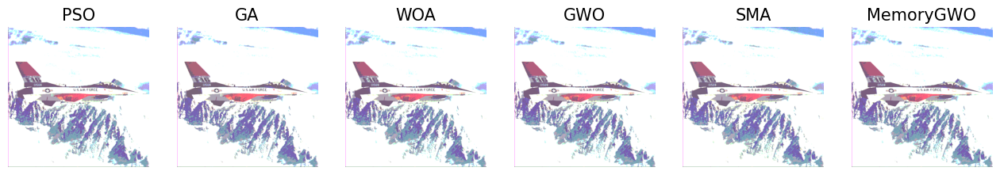

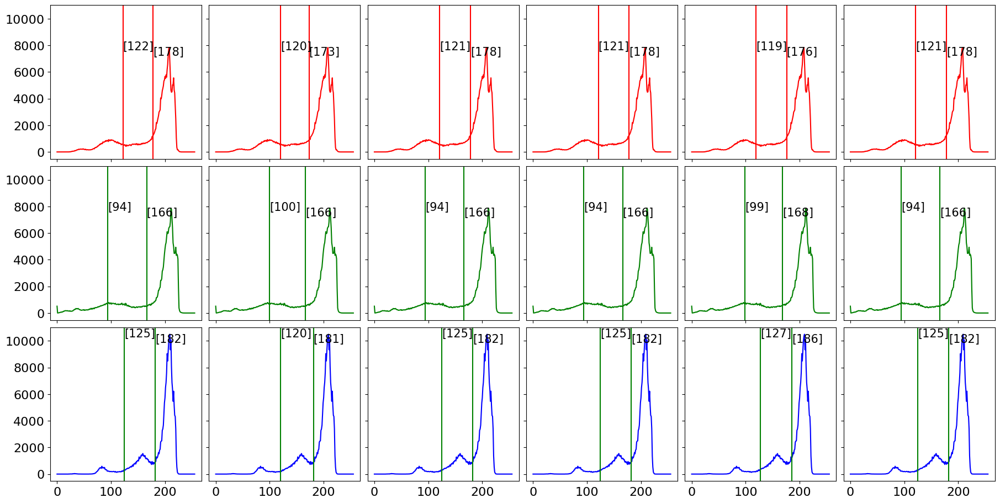

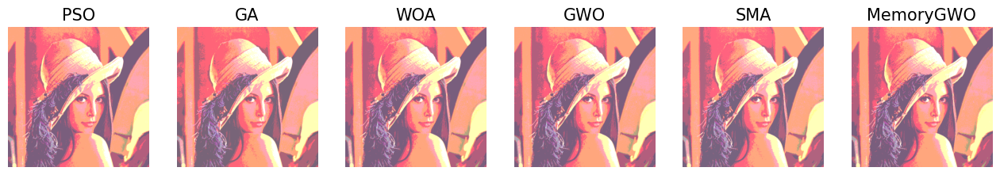

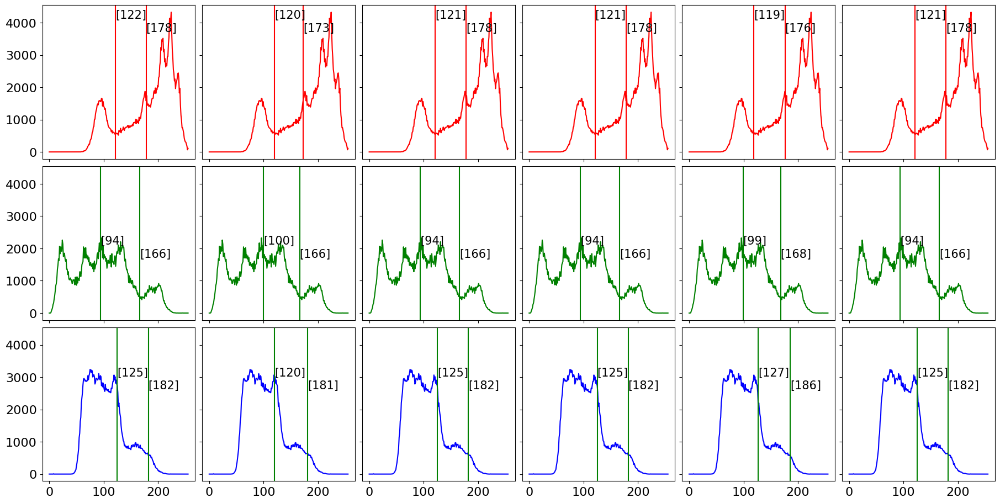

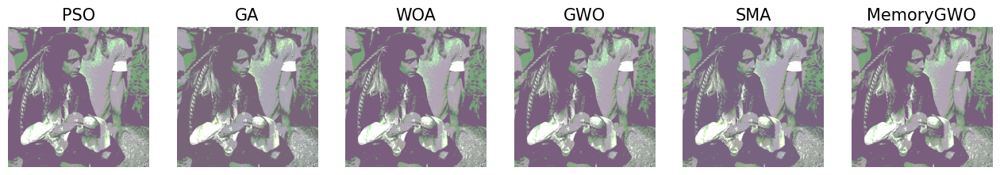

...

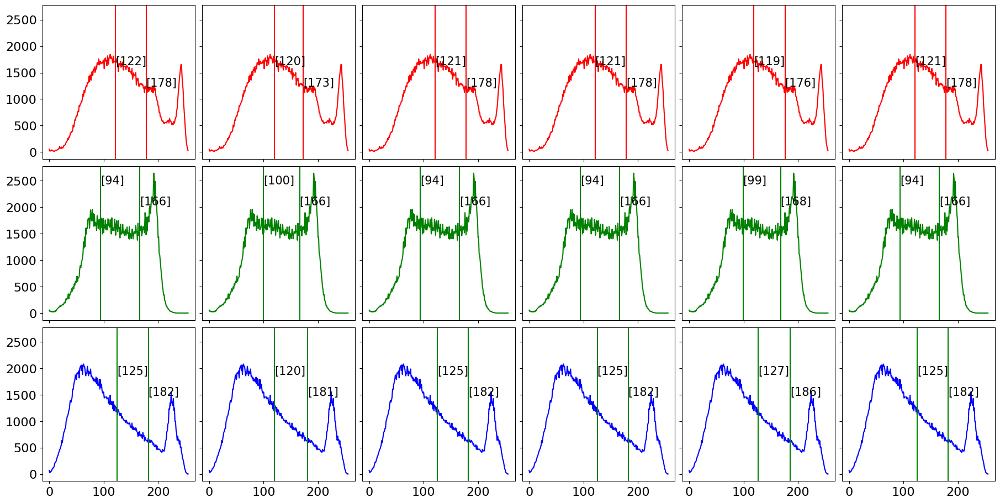

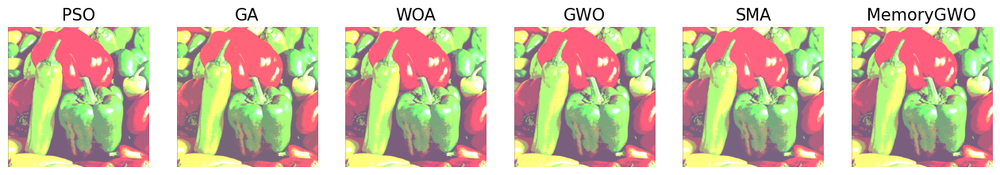

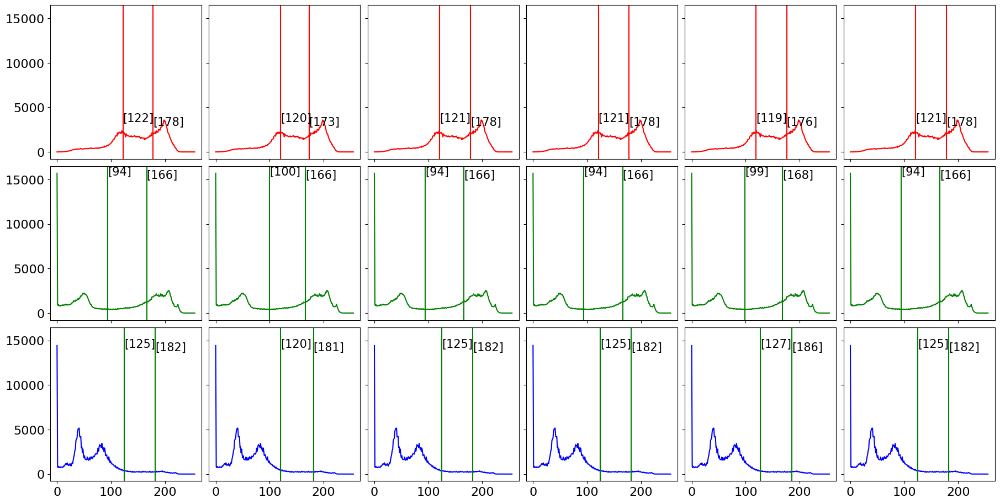

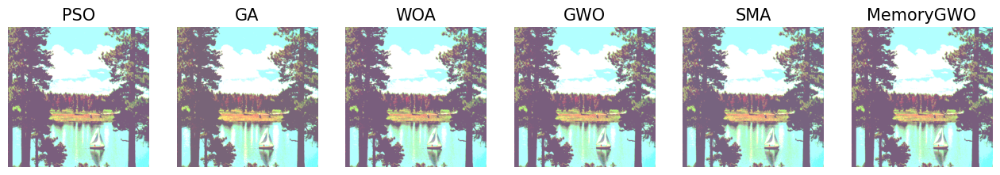

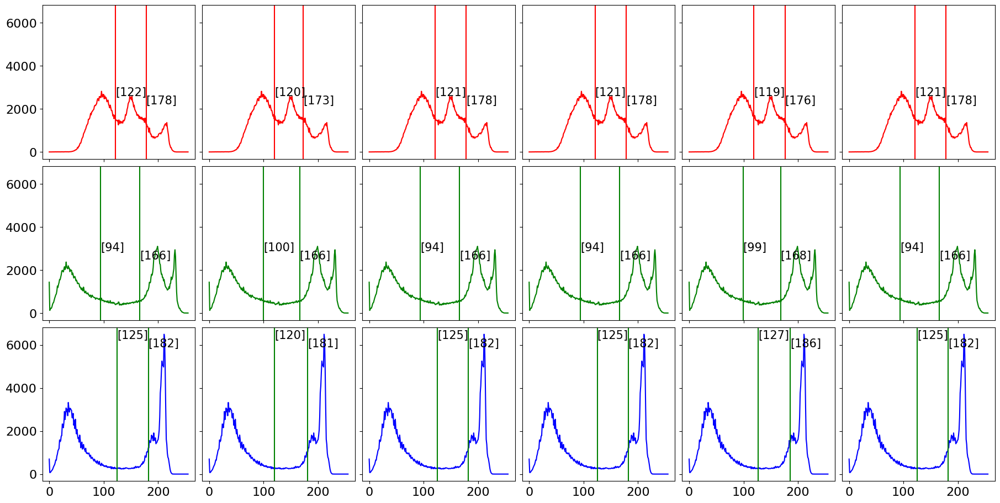

In [23]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400

## 3-Level

In [24]:
mLevel = 3
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,1,3,"[108, 158, 196]","[107, 158, 196]","[107, 158, 196]","[99, 146, 189]","[83, 150, 189]","[105, 156, 195]"
Lena.png,5,3,"[126, 175, 212]","[127, 176, 212]","[127, 176, 212]","[126, 170, 210]","[107, 157, 203]","[125, 173, 210]"
Male.tiff,9,3,"[39, 92, 142]","[39, 92, 142]","[39, 92, 142]","[44, 92, 141]","[42, 89, 155]","[33, 87, 139]"
Mandrill.tiff,13,3,"[92, 143, 198]","[96, 146, 200]","[96, 146, 200]","[98, 146, 199]","[66, 136, 195]","[92, 144, 199]"
Peppers.tiff,17,3,"[80, 131, 173]","[78, 132, 174]","[87, 136, 176]","[80, 134, 169]","[64, 133, 178]","[83, 133, 175]"
Sailboat on lake.tiff,21,3,"[97, 134, 178]","[94, 134, 178]","[97, 134, 178]","[100, 138, 180]","[75, 136, 183]","[96, 134, 178]"


In [25]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,1,3,"[122, 173, 202]","[122, 173, 201]","[122, 173, 201]","[120, 168, 194]","[93, 147, 189]","[122, 172, 201]"
Lena.png,5,3,"[84, 111, 147]","[83, 110, 147]","[83, 110, 147]","[84, 117, 155]","[56, 118, 160]","[80, 109, 146]"
Male.tiff,9,3,"[39, 92, 142]","[39, 92, 142]","[39, 92, 142]","[49, 101, 147]","[36, 91, 155]","[36, 89, 141]"
Mandrill.tiff,13,3,"[73, 123, 184]","[73, 123, 184]","[73, 123, 184]","[77, 125, 185]","[56, 120, 187]","[69, 121, 183]"
Peppers.tiff,17,3,"[28, 67, 131]","[28, 67, 131]","[28, 67, 131]","[36, 77, 137]","[41, 97, 163]","[23, 66, 130]"
Sailboat on lake.tiff,21,3,"[53, 104, 169]","[53, 105, 170]","[53, 105, 170]","[50, 102, 165]","[48, 110, 168]","[47, 101, 167]"


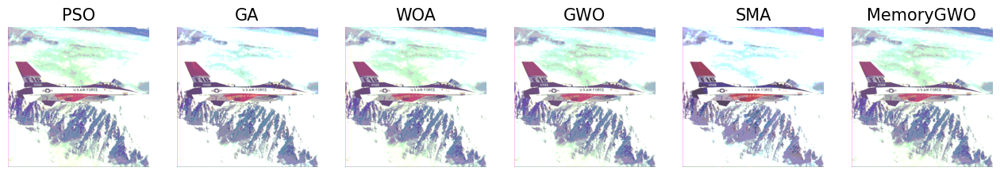

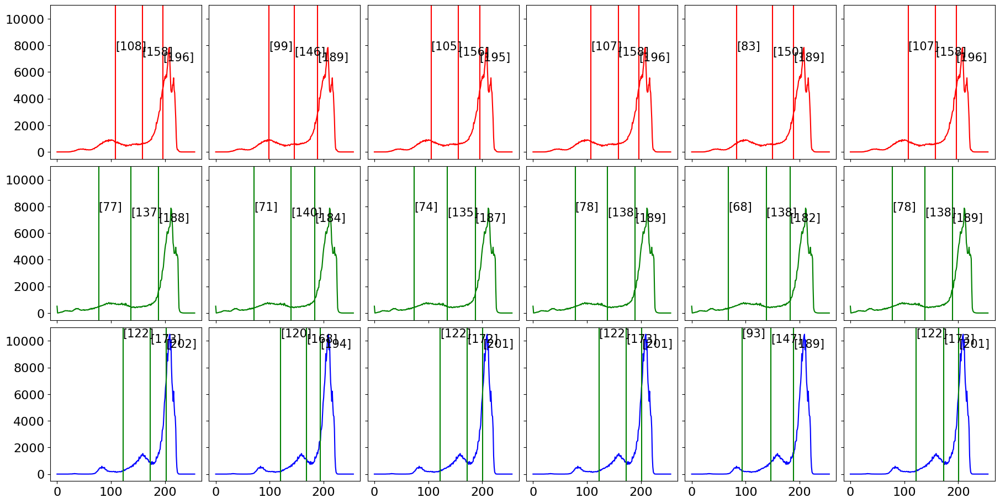

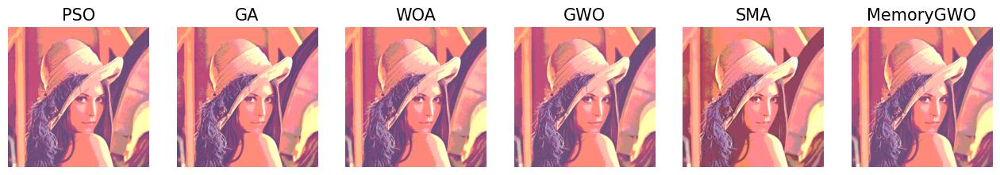

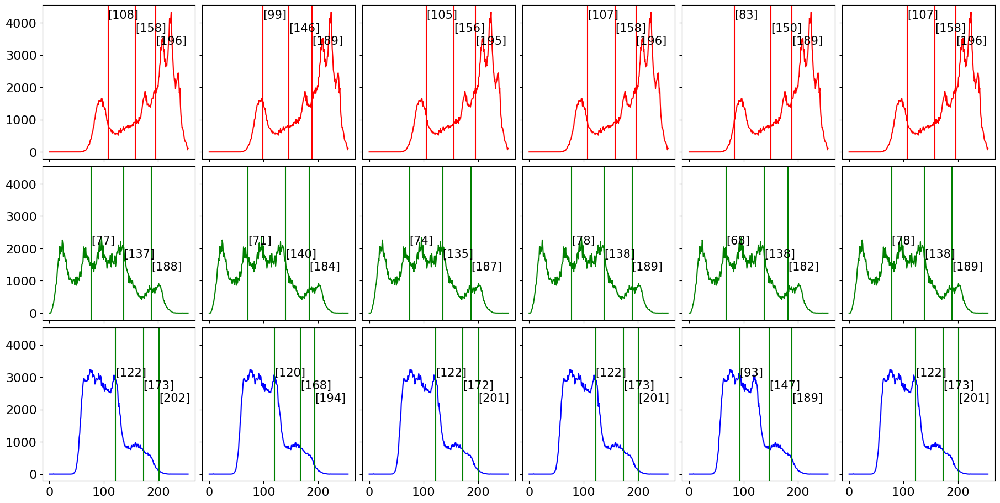

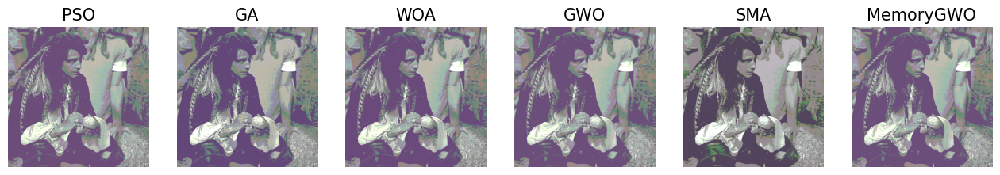

...

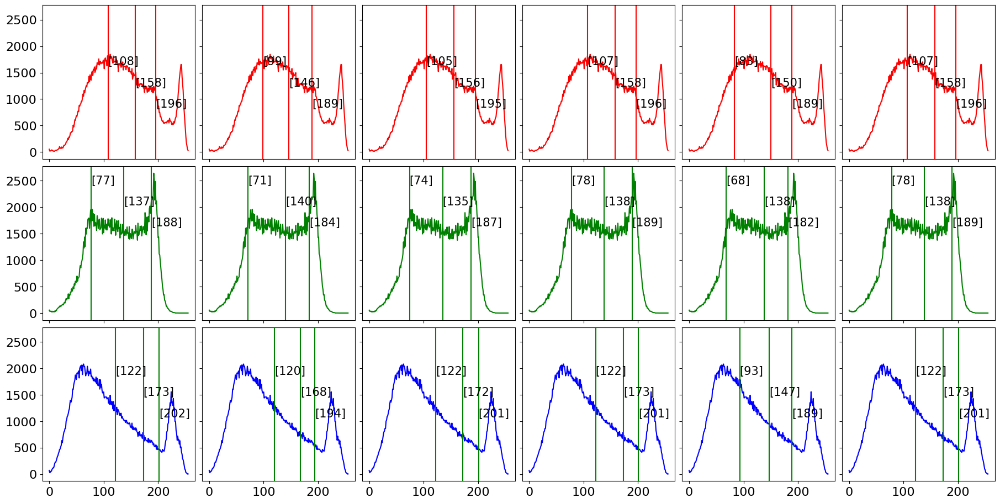

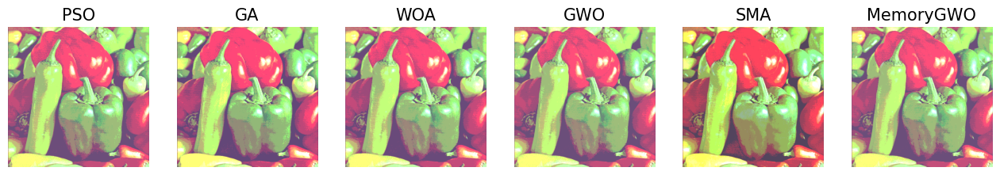

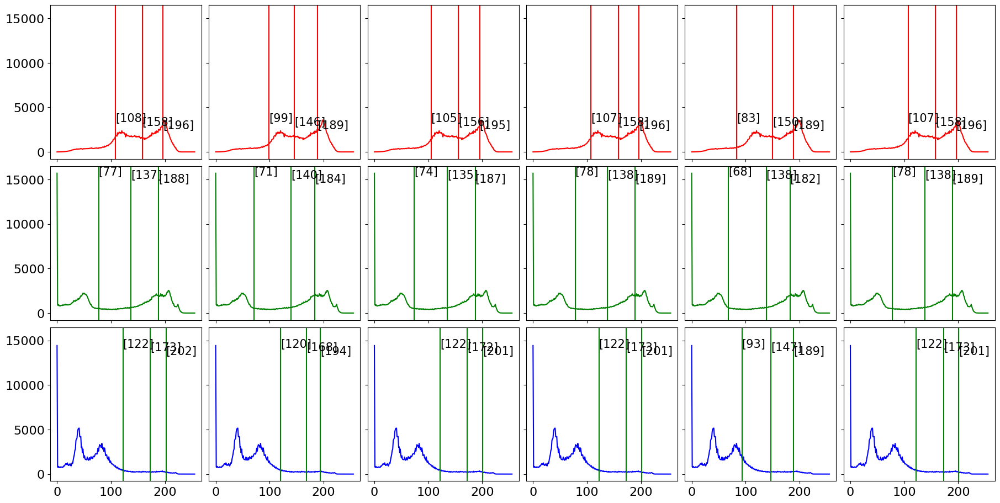

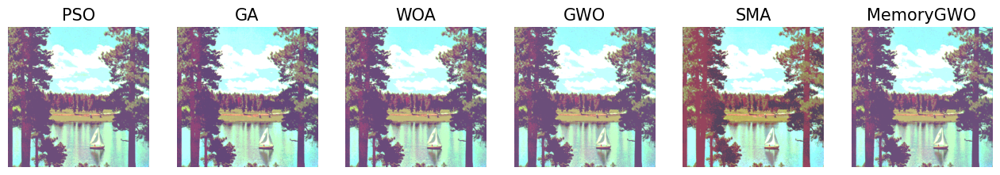

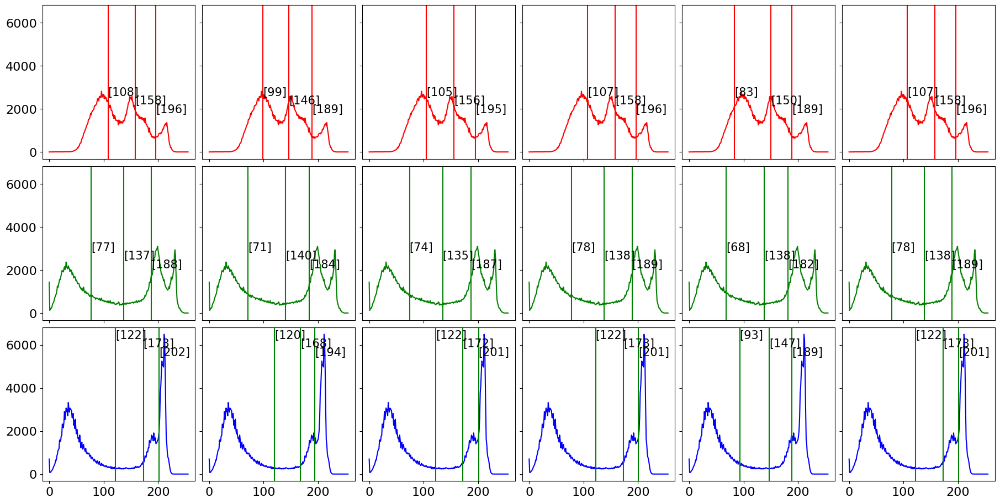

In [26]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400

## 4-Level

In [27]:
mLevel = 4
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,2,4,"[84, 128, 170, 200]","[84, 127, 170, 200]","[84, 127, 170, 200]","[83, 125, 160, 195]","[70, 128, 164, 198]","[82, 125, 168, 199]"
Lena.png,6,4,"[117, 158, 192, 218]","[117, 157, 191, 218]","[117, 157, 191, 218]","[121, 155, 186, 215]","[86, 133, 179, 213]","[115, 156, 190, 217]"
Male.tiff,10,4,"[34, 80, 122, 162]","[35, 82, 124, 164]","[35, 82, 124, 164]","[38, 84, 123, 168]","[19, 60, 110, 164]","[21, 65, 111, 155]"
Mandrill.tiff,14,4,"[77, 120, 160, 206]","[80, 122, 162, 208]","[80, 122, 162, 208]","[72, 118, 158, 207]","[41, 114, 161, 212]","[67, 116, 158, 207]"
Peppers.tiff,18,4,"[69, 116, 150, 183]","[79, 123, 156, 186]","[79, 123, 156, 186]","[74, 120, 155, 180]","[34, 95, 143, 189]","[43, 106, 146, 181]"
Sailboat on lake.tiff,22,4,"[93, 126, 158, 190]","[92, 125, 157, 189]","[92, 125, 157, 189]","[81, 117, 146, 183]","[50, 118, 153, 196]","[83, 121, 154, 188]"


In [28]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,2,4,"[113, 152, 181, 204]","[113, 151, 181, 204]","[112, 151, 181, 204]","[105, 146, 176, 200]","[65, 108, 160, 192]","[107, 147, 179, 203]"
Lena.png,6,4,"[82, 108, 135, 165]","[81, 106, 134, 164]","[81, 106, 134, 163]","[80, 104, 132, 161]","[36, 80, 118, 157]","[70, 101, 127, 157]"
Male.tiff,10,4,"[35, 81, 122, 162]","[35, 82, 124, 164]","[35, 82, 124, 164]","[40, 81, 120, 167]","[16, 59, 108, 168]","[28, 72, 116, 159]"
Mandrill.tiff,14,4,"[61, 99, 142, 194]","[62, 100, 144, 195]","[62, 100, 143, 195]","[63, 105, 147, 198]","[34, 89, 144, 198]","[47, 90, 137, 191]"
Peppers.tiff,18,4,"[26, 61, 96, 147]","[26, 61, 96, 147]","[26, 61, 96, 147]","[32, 63, 104, 158]","[23, 62, 108, 165]","[18, 52, 88, 143]"
Sailboat on lake.tiff,22,4,"[46, 86, 143, 192]","[48, 89, 147, 194]","[47, 88, 146, 193]","[51, 92, 143, 184]","[29, 72, 126, 175]","[36, 79, 135, 187]"


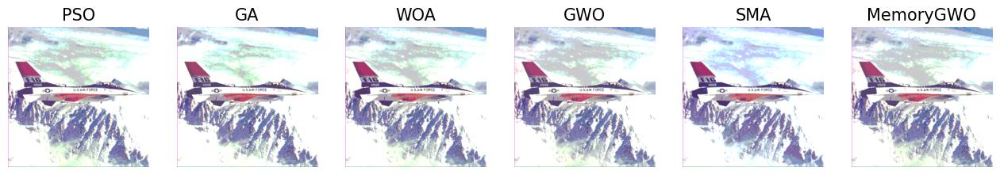

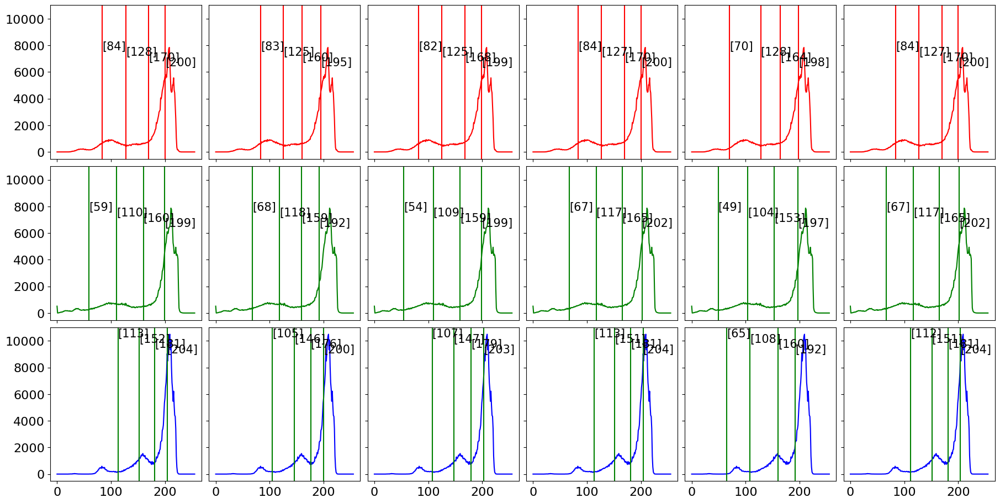

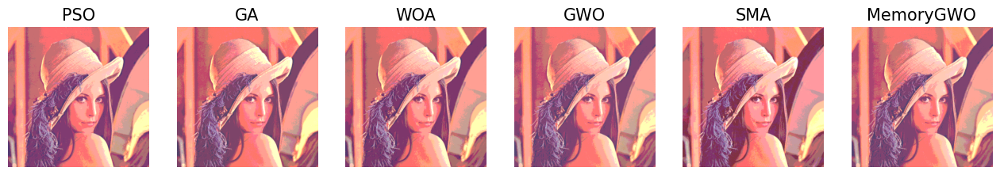

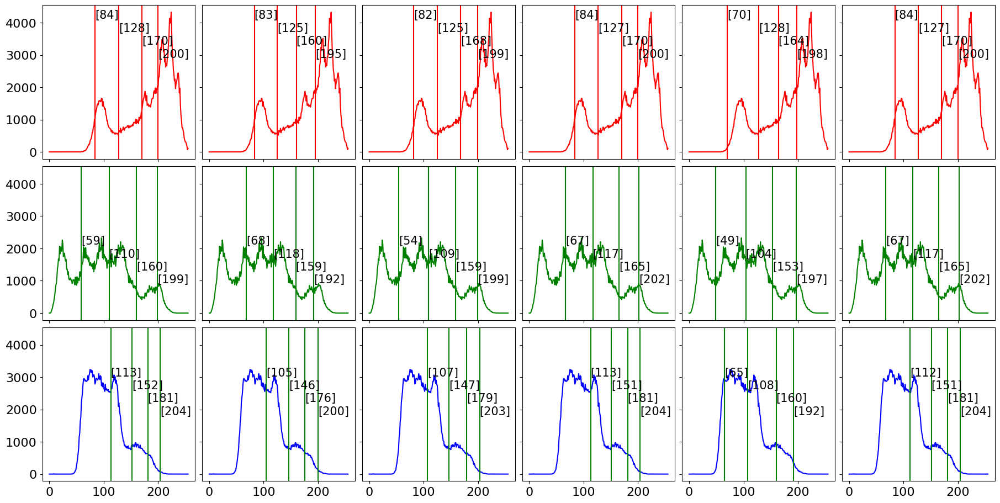

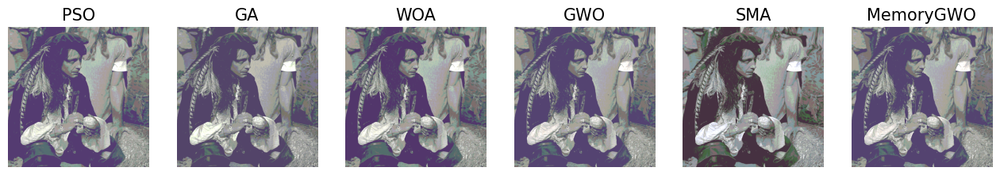

...

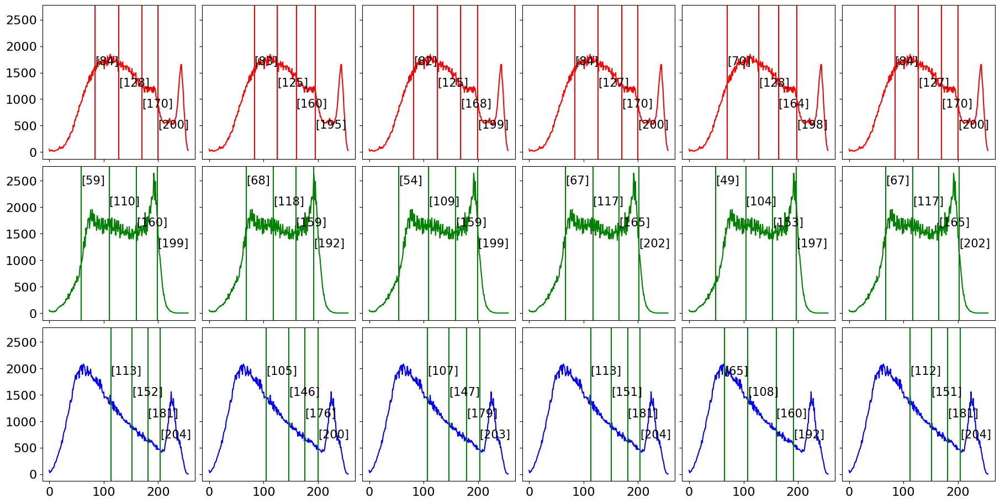

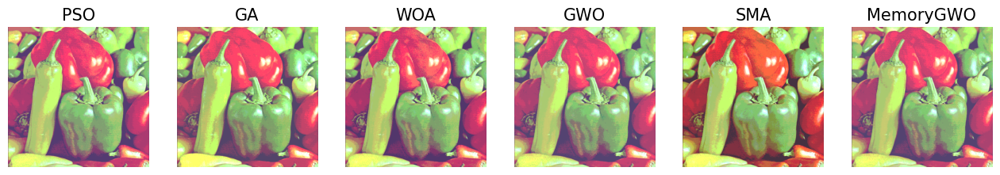

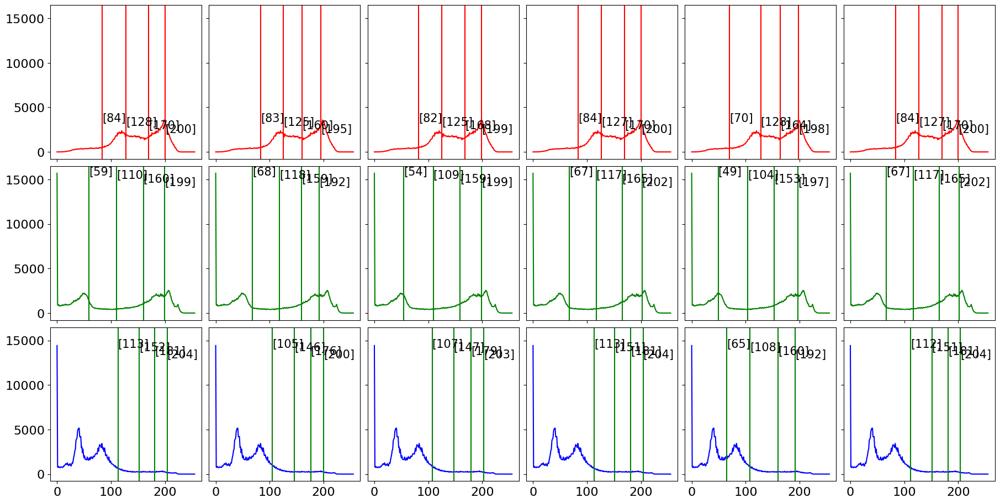

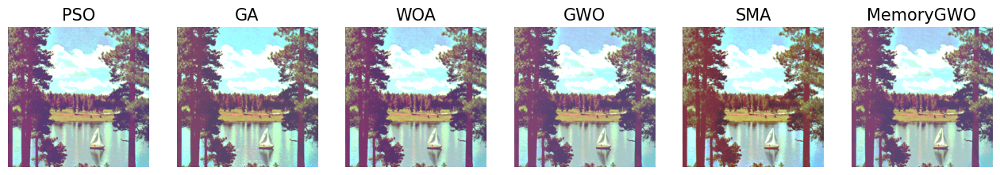

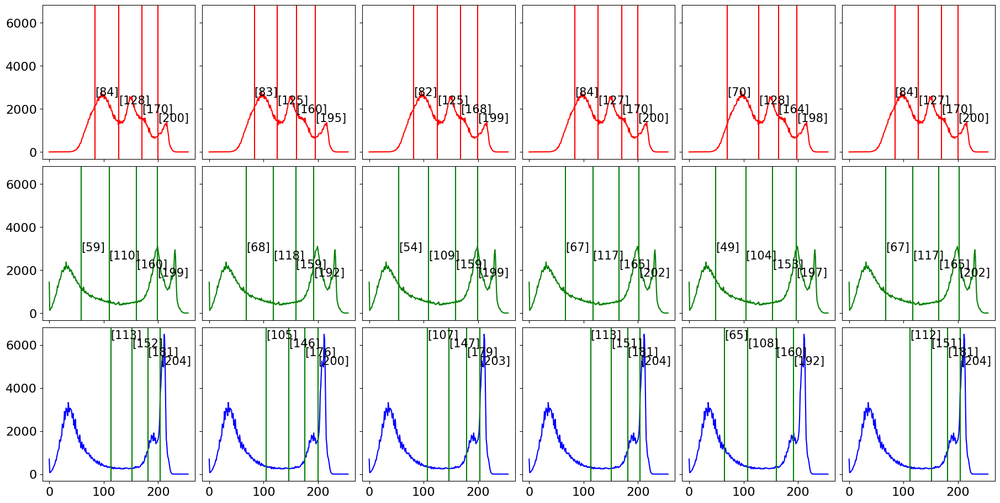

In [29]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400

## 5-Level

In [30]:
mLevel = 5
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,3,5,"[78, 115, 151, 182, 204]","[75, 112, 148, 180, 202]","[76, 113, 149, 181, 203]","[77, 112, 144, 175, 201]","[42, 91, 134, 167, 197]","[70, 108, 143, 177, 201]"
Lena.png,7,5,"[112, 147, 177, 201, 224]","[112, 146, 176, 201, 223]","[112, 147, 177, 201, 223]","[103, 137, 169, 195, 220]","[81, 122, 158, 192, 226]","[105, 137, 168, 196, 220]"
Male.tiff,11,5,"[22, 57, 94, 129, 167]","[28, 65, 100, 134, 172]","[28, 65, 100, 134, 172]","[30, 67, 99, 135, 179]","[10, 37, 84, 129, 180]","[14, 49, 89, 127, 167]"
Mandrill.tiff,15,5,"[48, 96, 130, 166, 209]","[68, 104, 137, 171, 212]","[73, 106, 138, 172, 212]","[69, 111, 147, 181, 216]","[29, 83, 134, 173, 212]","[37, 84, 123, 163, 208]"
Peppers.tiff,19,5,"[43, 94, 128, 158, 187]","[64, 104, 133, 162, 189]","[70, 106, 134, 163, 190]","[63, 103, 138, 161, 186]","[31, 85, 128, 166, 198]","[38, 82, 123, 156, 186]"
Sailboat on lake.tiff,23,5,"[86, 110, 136, 163, 192]","[77, 107, 134, 161, 191]","[80, 108, 134, 161, 191]","[80, 108, 132, 163, 193]","[26, 73, 123, 156, 190]","[68, 98, 129, 158, 190]"


In [31]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,3,5,"[112, 147, 173, 195, 208]","[108, 145, 172, 193, 208]","[109, 145, 172, 193, 208]","[91, 131, 161, 182, 202]","[53, 95, 139, 176, 200]","[104, 139, 166, 189, 207]"
Lena.png,7,5,"[76, 97, 117, 141, 170]","[70, 93, 113, 138, 167]","[75, 94, 114, 139, 167]","[60, 93, 116, 140, 169]","[31, 72, 115, 150, 181]","[63, 88, 110, 135, 164]"
Male.tiff,11,5,"[27, 64, 99, 133, 171]","[28, 65, 100, 134, 172]","[29, 66, 101, 134, 172]","[29, 70, 100, 138, 175]","[12, 42, 88, 141, 198]","[12, 42, 83, 123, 164]"
Mandrill.tiff,15,5,"[47, 78, 111, 150, 197]","[51, 83, 117, 155, 200]","[53, 84, 117, 155, 200]","[52, 84, 121, 159, 203]","[25, 77, 116, 169, 211]","[20, 67, 105, 147, 196]"
Peppers.tiff,19,5,"[22, 52, 77, 108, 156]","[25, 55, 82, 113, 160]","[25, 56, 82, 113, 160]","[23, 57, 85, 122, 168]","[12, 43, 84, 130, 186]","[12, 38, 68, 101, 152]"
Sailboat on lake.tiff,23,5,"[32, 61, 100, 152, 194]","[38, 66, 107, 157, 196]","[38, 66, 107, 157, 196]","[43, 81, 122, 162, 196]","[18, 51, 98, 139, 183]","[18, 50, 92, 146, 192]"


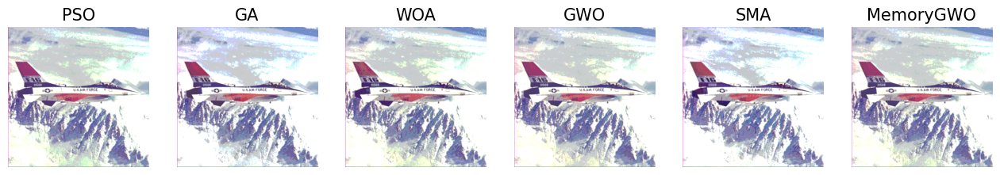

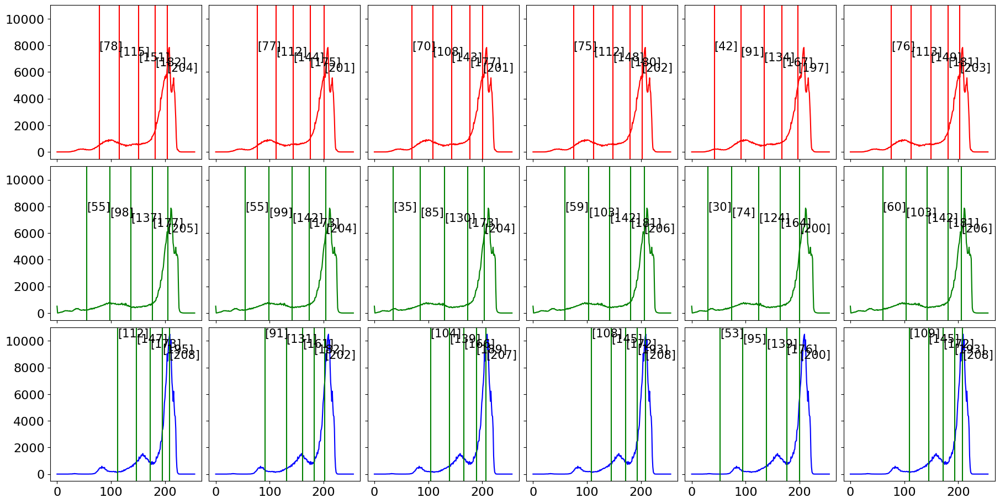

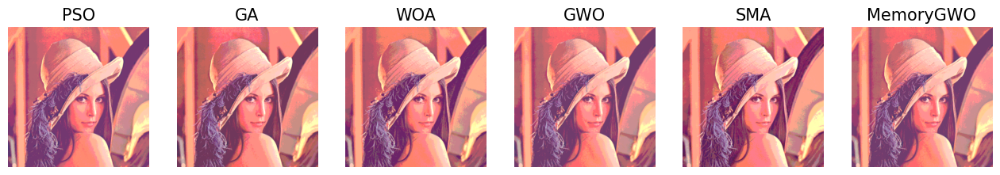

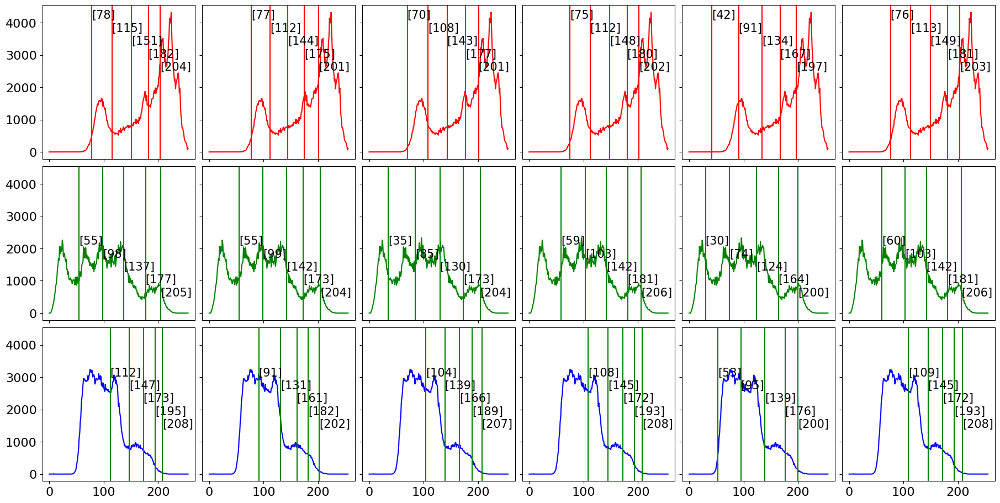

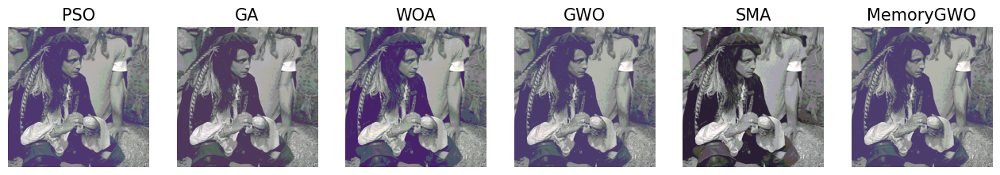

...

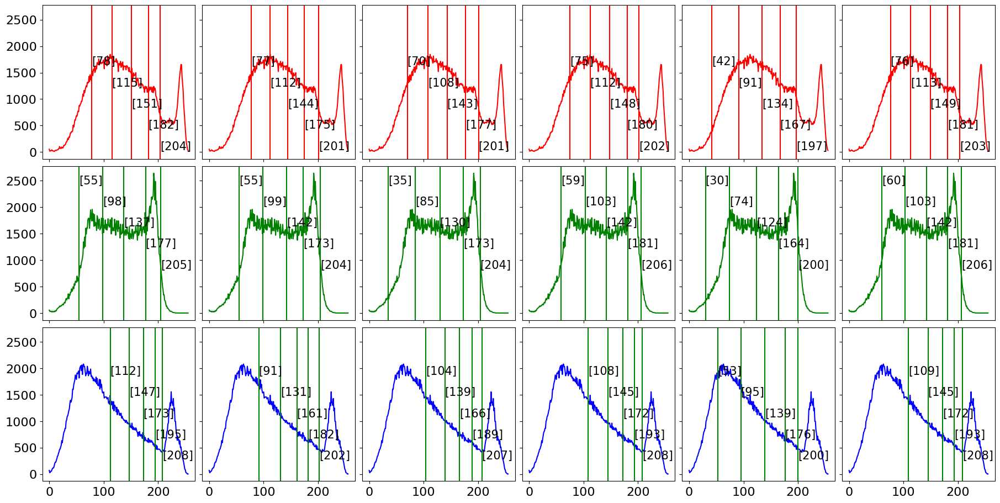

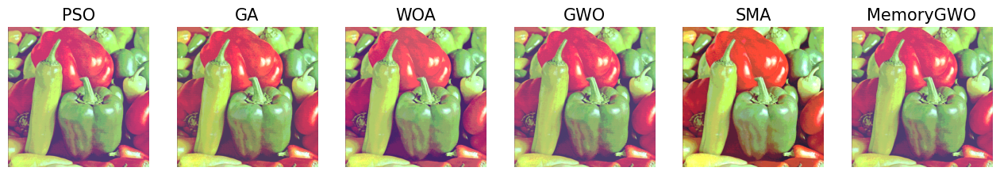

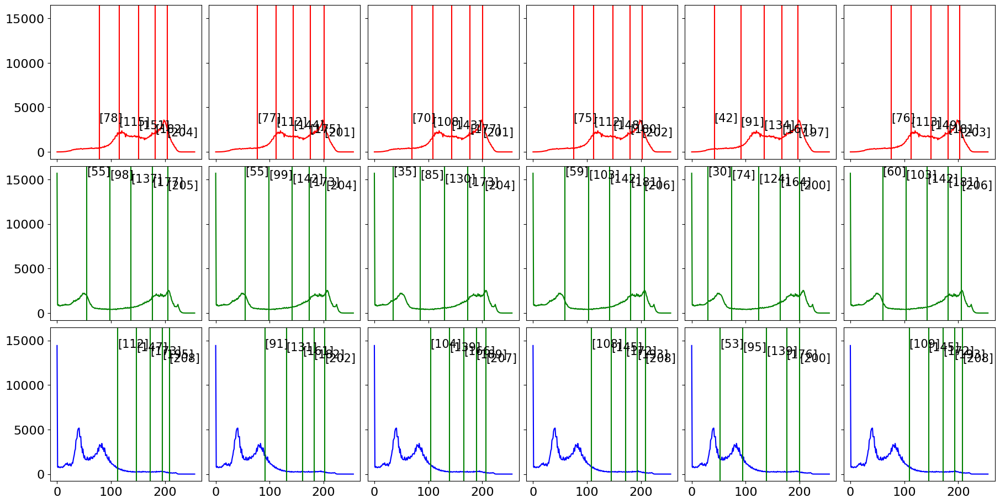

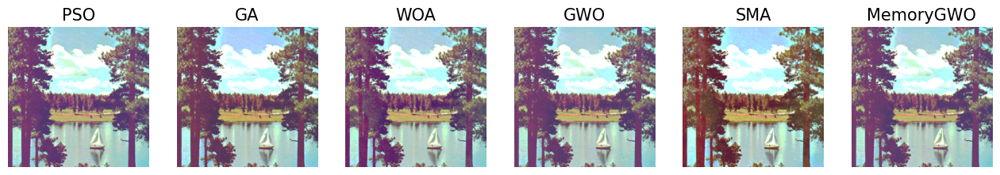

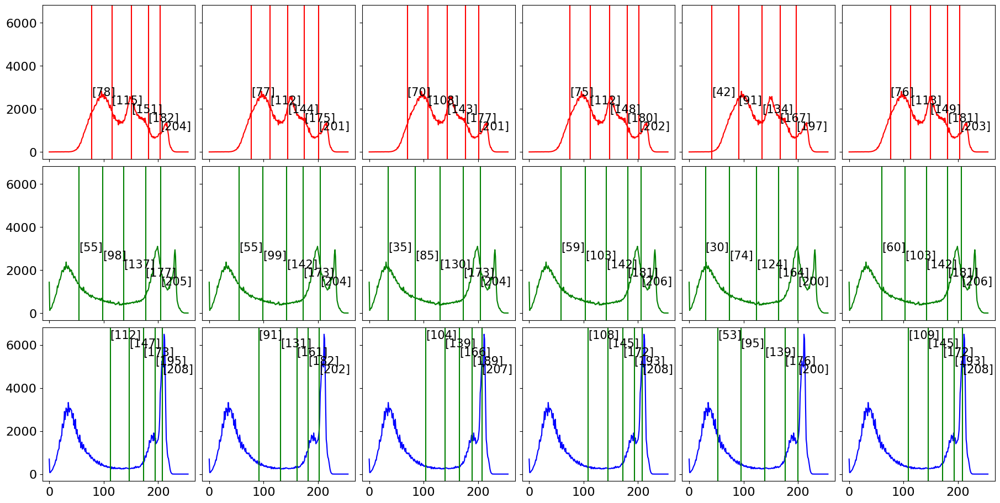

In [32]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400